In [1]:
from micromind import Metric
from micromind.utils.parse import parse_arguments

import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms

import os
import random
import importlib
import numpy as np

from tqdm import tqdm

import matplotlib.pyplot as plt

batch_size = 64

In [2]:
import pickle

# with open('embeddings_.pkl', 'wb') as file:
#     pickle.dump({"outputs":x, "labels":y}, file)    

In [3]:
with open('embeddings_all.pkl', 'rb') as file:
    data = pickle.load(file)

x = data["outputs"].cpu().numpy()
y = data["labels"].cpu().numpy()

In [4]:
print(x.shape)
print(y.shape)

(49984, 344)
(49984,)


In [12]:
# print min and max of first 10 embeddings

for i in range(10):
    print(np.min(x[i]), np.max(x[i]))

-6.419877 5.311053
-3.93391 9.475941
-4.102253 5.1120706
-6.1362176 5.166823
-9.102541 4.6510944
-5.5443807 5.5855756
-8.631276 4.068252
-5.784445 6.744329
-6.891425 4.5591264
-6.3155346 4.5588555


In [5]:
# normalize embeddings
x = (x - np.min(x)) / (np.max(x) - np.min(x))

In [6]:
embeddings = np.array(x)

In [7]:
from sklearn.decomposition import PCA

pca = PCA(n_components=200)
pca_result = pca.fit_transform(embeddings)

/Users/sebastiancavada/anaconda3/envs/ai701/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


[1 0 0 ... 0 1 1]


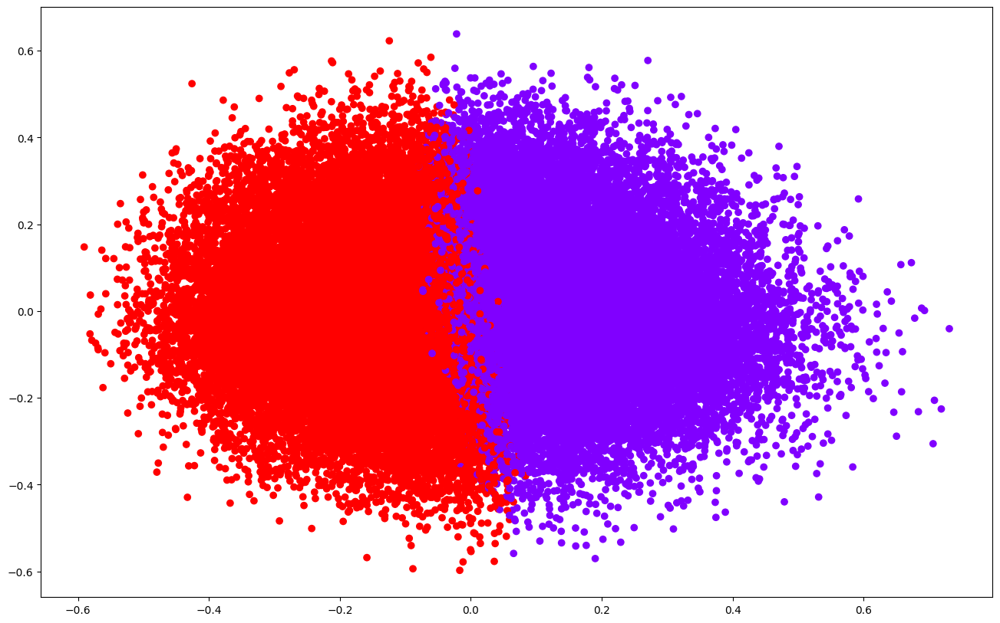

In [30]:
## L2 distancem clustering



kmeans = KMeans(n_clusters=2, random_state=0).fit(embeddings)
print(kmeans.labels_)

pca = PCA(n_components=200)
pca_result = pca.fit_transform(embeddings)

# draw a line between the two clusters with SVM

from sklearn import svm
clf = svm.SVC()
clf.fit(pca_result, kmeans.labels_)
print(clf.coef_)





plt.figure(figsize=(16,10))
plt.scatter(pca_result[:,0], pca_result[:,1], c=kmeans.labels_, cmap='rainbow')

#plot the line


plt.show()


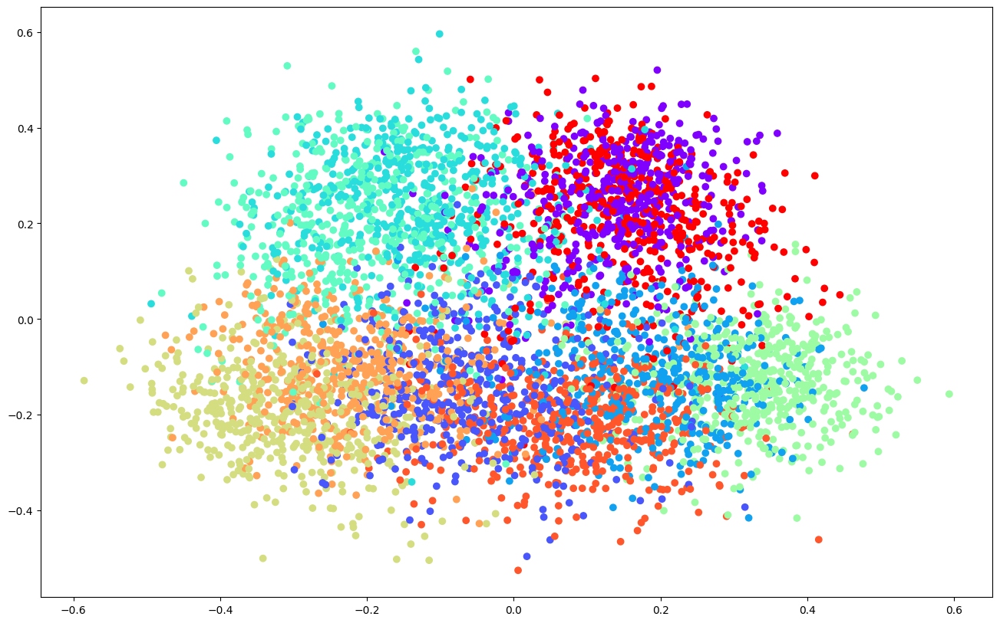

In [63]:
#only take the embeddings corresponding to the first 10 classes

x_10 = embeddings[y < 10]
y_10 = y[y < 10]

pca_result_10 = pca.fit_transform(x_10)

plt.figure(figsize=(16,10))
plt.scatter(pca_result_10[:,0], pca_result_10[:,1], c=y_10, cmap='rainbow')

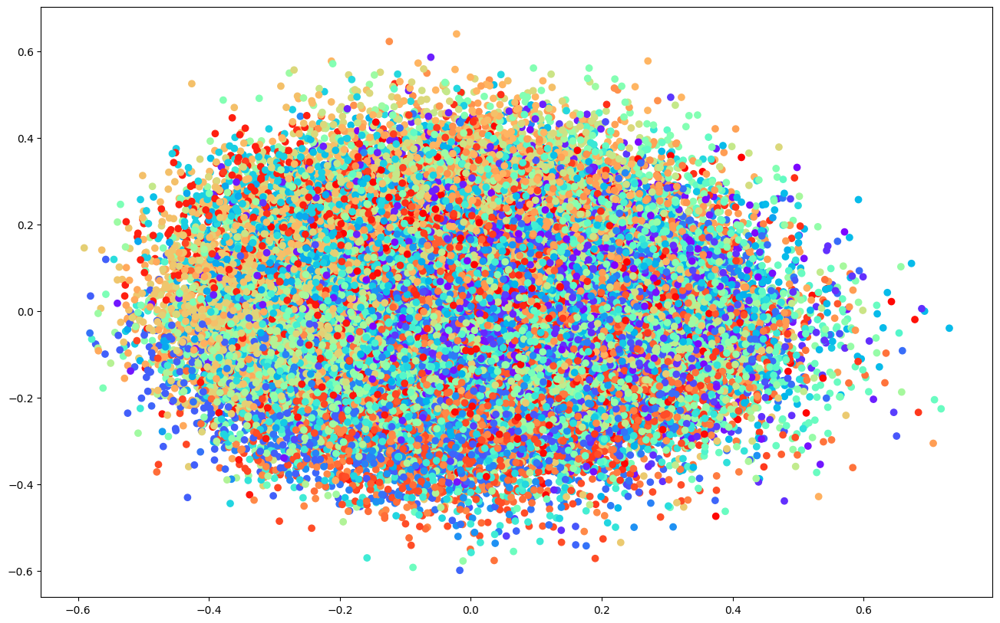

In [61]:
plt.figure(figsize=(16,10))
plt.scatter(pca_result[:,0], pca_result[:,1], c=y, cmap='rainbow')

In [56]:
## L2 distancem clustering

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

kmeans = KMeans(n_clusters=2, random_state=0).fit(embeddings)
print(kmeans.labels_)

pca = PCA(n_components=3)
pca_result = pca.fit_transform(embeddings)

/Users/sebastiancavada/anaconda3/envs/ai701/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


[1 0 0 ... 0 1 1]


In [57]:
import plotly.express as px

fig = px.scatter_3d(pca_result, x=0, y=1, z=2, color=kmeans.labels_)

fig.show()

In [58]:
from sklearn.manifold import TSNE

projections = TSNE(n_components = 3).fit_transform(embeddings)

In [60]:
fig = px.scatter_3d(projections, x=0, y=1, z=2, color=kmeans.labels_)

fig.show()

In [48]:
kmeans.labels_

array([1, 0, 0, ..., 0, 1, 1], dtype=int32)

In [36]:
y

array([17,  3, 88, ..., 82, 27, 66])

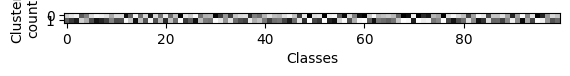

In [59]:
#fpr every label in 1 to 100 we want to see how many go to 

# matrix 10 x 100 -> for every row we see where how many labels from x target go to that cluster

a = np.zeros((kmeans.cluster_centers_.shape[0],100))

#print(a)

for i, cluster in enumerate(kmeans.labels_):
    a[cluster][y[i]] += 1

plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")
plt.imshow(a,cmap='Greys_r')



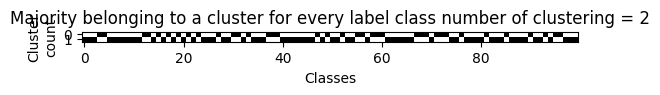

In [44]:
## majority voting for each class
b = np.argmax(a, axis=0)

c = np.zeros((kmeans.cluster_centers_.shape[0],100))
for x in range(100):    
    c[b[x]][x] = 1

plt.xlabel("Classes")
plt.ylabel("Cluster\ncount")
plt.title("Majority belonging to a cluster for every label class number of clustering = " + str(centroids.shape[0]))
plt.imshow(c, cmap='Greys_r')

In [46]:
false_negative = np.sum(np.ma.array(a,mask=c))
print(false_negative)

false_negative/np.sum(a)

11553.0


0.2311339628681178

In [19]:
np.sum(c, axis=1)

array([37., 63.])

In [64]:
#do pca on the embeddings

pca = PCA(n_components=30)

pca_result = pca.fit_transform(embeddings)

pca_result.shape

(49984, 30)

In [65]:

#fit a decision tree on the embeddings

from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier(random_state=0, max_depth=10)

clf.fit(pca_result, y)

clf.score(pca_result, y)



1.0